# TLT Image Classification 

Transfer learning is the process of transferring learned features from one application to another. It is a commonly used training technique where you use a model trained on one task and re-train to use it on a different task. 

Transfer Learning Toolkit (TLT) is a simple and easy-to-use Python based AI toolkit for taking purpose-built AI models and customizing them with users' own data.

<img align="center" src="https://developer.nvidia.com/sites/default/files/akamai/embedded-transfer-learning-toolkit-software-stack-1200x670px.png" width="1080"> 

## Learning Objectives
In this notebook, you will learn how to leverage the simplicity and convenience of TLT to:

* Take a pretrained resnet18 model and finetune on a sample dataset converted from PascalVOC
* Prune the finetuned model
* Retrain the pruned model to recover lost accuracy
* Export the pruned model
* Run Inference on the trained model
* Export the pruned and retrained model to a .etlt file for deployment to DeepStream

### Table of Contents
This notebook shows an example use case for classification using the Transfer Learning Toolkit.

0. [Set up env variables and map drives](#head-0)
1. [Installing the TLT Launcher](#head-1)
2. [Prepare dataset and pretrained model](#head-2)
    1. [Split the dataset into train/test/val](#head-2-1)
    2. [Download pre-trained model](#head-2-2)
3. [Provide training specfication](#head-3)
4. [Run TLT training](#head-4)
5. [Evaluate trained models](#head-5)
6. [Prune trained models](#head-6)
7. [Retrain pruned models](#head-7)
8. [Testing the model](#head-8)
9. [Visualize inferences](#head-9)
10. [Export and Deploy!](#head-10)
    1. [Int8 Optimization](#head-10-1)
    2. [Generate TensorRT engine](#head-10-2)

## 0. Set up env variables and map drives <a class="anchor" id="head-0"></a>
When using the purpose-built pretrained models from NGC, please make sure to set the `$KEY` environment variable to the key as mentioned in the model overview. Failing to do so, can lead to errors when trying to load them as pretrained models.

The following notebook requires the user to set an env variable called the `$LOCAL_PROJECT_DIR` as the path to the users workspace. Please note that the dataset to run this notebook is expected to reside in the `$LOCAL_PROJECT_DIR/data`, while the TLT experiment generated collaterals will be output to `$LOCAL_PROJECT_DIR/classification`. More information on how to set up the dataset and the supported steps in the TLT workflow are provided in the subsequent cells.

*Note: Please make sure to remove any stray artifacts/files from the `$USER_EXPERIMENT_DIR` or `$DATA_DOWNLOAD_DIR` paths as mentioned below, that may have been generated from previous experiments. Having checkpoint files etc may interfere with creating a training graph for a new experiment.*

*Note: This notebook currently is by default set up to run training using 1 GPU. To use more GPU's please update the env variable `$NUM_GPUS` accordingly*

In [1]:
# Setting up env variables for cleaner command line commands.
import os

%env KEY=nvidia_tlt
%env NUM_GPUS=1
%env USER_EXPERIMENT_DIR=/workspace/tlt-experiments/classification
%env DATA_DOWNLOAD_DIR=/workspace/tlt-experiments/data

# Set this path if you don't run the notebook from the samples directory.
# %env NOTEBOOK_ROOT=~/tlt-samples/classification

# Please define this local project directory that needs to be mapped to the TLT docker session.
# The dataset expected to be present in $LOCAL_PROJECT_DIR/data, while the results for the steps
# in this notebook will be stored at $LOCAL_PROJECT_DIR/classification
# !PLEASE MAKE SURE TO UPDATE THIS PATH!.
os.environ["LOCAL_PROJECT_DIR"] = '/home/ubuntu/gender_project'

os.environ["LOCAL_DATA_DIR"] = os.path.join(
    os.getenv("LOCAL_PROJECT_DIR", os.getcwd()),
    "data"
)
os.environ["LOCAL_EXPERIMENT_DIR"] = os.path.join(
    os.getenv("LOCAL_PROJECT_DIR", os.getcwd()),
    "classification"
)

# The sample spec files are present in the same path as the downloaded samples.
os.environ["LOCAL_SPECS_DIR"] = os.path.join(
    os.getenv("NOTEBOOK_ROOT", os.getcwd()),
    "specs"
)
%env SPECS_DIR=/workspace/tlt-experiments/classification/specs

# Showing list of specification files.
!ls -rlt $LOCAL_SPECS_DIR

env: KEY=nvidia_tlt
env: NUM_GPUS=1
env: USER_EXPERIMENT_DIR=/workspace/tlt-experiments/classification
env: DATA_DOWNLOAD_DIR=/workspace/tlt-experiments/data
env: SPECS_DIR=/workspace/tlt-experiments/classification/specs
/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
total 24
-rw------- 1 ubuntu ubuntu 1142 Mar 10 16:33 classification_retrain_spec.cfg
-rw-rw-r-- 1 ubuntu ubuntu 1805 Mar 23 17:59 efficient_retrain_spec.cfg
-rw-rw-r-- 1 ubuntu ubuntu 2003 Mar 23 20:03 efficient_spec.cfg
-rw------- 1 ubuntu ubuntu 1285 Mar 23 20:10 classification_spec.cfg
-rw-rw-r-- 1 ubuntu ubuntu 1948 Mar 24 17:14 mobilenet_spec.cfg
-rw-rw-r-- 1 ubuntu ubuntu 1971 Mar 24 21:29 mobilenet_retrain_spec.cfg


The cell below maps the project directory on your local host to a workspace directory in the TLT docker instance, so that the data and the results are mapped from outside to inside of the docker instance.

In [2]:
# Mapping up the local directories to the TLT docker.
import json
import os
mounts_file = os.path.expanduser("~/.tlt_mounts.json")

# Define the dictionary with the mapped drives
drive_map = {
    "Mounts": [
        # Mapping the data directory
        {
            "source": os.environ["LOCAL_PROJECT_DIR"],
            "destination": "/workspace/tlt-experiments"
        },
        # Mapping the specs directory.
        {
            "source": os.environ["LOCAL_SPECS_DIR"],
            "destination": os.environ["SPECS_DIR"]
        },
    ],
    "DockerOptions":{
        "user": "{}:{}".format(os.getuid(), os.getgid())
    }
}

# Writing the mounts file.
with open(mounts_file, "w") as mfile:
    json.dump(drive_map, mfile, indent=4)

In [4]:
!cat ~/.tlt_mounts.json

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
{
    "Mounts": [
        {
            "source": "/home/ubuntu/gender_project",
            "destination": "/workspace/tlt-experiments"
        },
        {
            "source": "/home/ubuntu/gender_project/specs",
            "destination": "/workspace/tlt-experiments/classification/specs"
        }
    ],
    "DockerOptions": {
        "user": "1000:1000"
    }
}

## 1. Installing the TLT launcher <a class="anchor" id="head-1"></a>
The TLT launcher is a python package distributed as a python wheel listed in the `nvidia-pyindex` python index. You may install the launcher by executing the following cell.

Please note that TLT recommends users to run the TLT launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

```sh
export VIRTUALENVWRAPPER_PYTHON=/path/to/bin/python3.x
```
where x >= 6 and <= 8

We recommend performing this step first and then launching the notebook from the virtual environment. In addition to installing TLT python package, please make sure of the following software requirements:
* python >=3.6.9 < 3.8.x
* docker-ce > 19.03.5
* docker-API 1.40
* nvidia-container-toolkit > 1.3.0-1
* nvidia-container-runtime > 3.4.0-1
* nvidia-docker2 > 2.5.0-1
* nvidia-driver > 455+

Once you have installed the pre-requisites, please log in to the docker registry nvcr.io by following the command below

```sh
docker login nvcr.io
```

You will be trigerred to enter a username and password. The username is `$oauthtoken` and the password is the API key generated from `ngc.nvidia.com`. Please follow the instructions in the [NGC setup guide](https://docs.nvidia.com/ngc/ngc-overview/index.html#generating-api-key) to generate your own API key.

Please note that TLT recommends users to run the TLT launcher in a virtual env with python 3.6.9. You may follow the instruction in this [page](https://virtualenvwrapper.readthedocs.io/en/latest/install.html) to set up a python virtual env using the `virtualenv` and `virtualenvwrapper` packages. Once you have setup virtualenvwrapper, please set the version of python to be used in the virtual env by using the `VIRTUALENVWRAPPER_PYTHON` variable. You may do so by running

In [6]:
!unset module

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'


In [5]:
# SKIP this cell IF you have already installed the TLT launcher.
!pip3 install nvidia-pyindex
!pip3 install nvidia-tlt

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
  Created wheel for nvidia-pyindex: filename=nvidia_pyindex-1.0.6-py3-none-any.whl size=4173 sha256=ff11cbc5035e823152a3decdcdb1ff7dd49d32b27030f038bbd57c442eab1b2b
  Stored in directory: /home/ubuntu/.cache/pip/wheels/52/31/c8/db9f8939a8bb1f3500ce81b630604cbfa6e31f82c8f1bd914d
Successfully built nvidia-pyindex
/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 143 kB 78.0 MB/s eta 0:00:01
     |███████████████████

In [7]:
# View the versions of the TLT launcher
!tlt info

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
Configuration of the TLT Instance
dockers: ['nvcr.io/nvidia/tlt-streamanalytics', 'nvcr.io/nvidia/tlt-pytorch']
format_version: 1.0
tlt_version: 3.0
published_date: 02/02/2021


## 2. Prepare datasets and pre-trained model <a class="anchor" id="head-2"></a>

We will be using the pascal VOC dataset for the tutorial. To find more details please visit 
http://host.robots.ox.ac.uk/pascal/VOC/voc2012/index.html#devkit. Please download the dataset present at http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar to $DATA_DOWNLOAD_DIR.

In [ ]:
# Check that file is present
import os
DATA_DIR = os.environ.get('LOCAL_DATA_DIR')
print(DATA_DIR)
if not os.path.isfile(os.path.join(DATA_DIR , 'VOCtrainval_11-May-2012.tar')):
    print('tar file for dataset not found. Please download.')
else:
    print('Found dataset.')

In [ ]:
# unpack 
!tar -xvf $LOCAL_DATA_DIR/VOCtrainval_11-May-2012.tar -C $LOCAL_DATA_DIR 

In [ ]:
# verify
!ls $LOCAL_DATA_DIR/VOCdevkit/VOC2012

### A. Split the dataset into train/val/test <a class="anchor" id="head-1-1"></a>

Pascal VOC Dataset is converted to our format (for classification) and then to train/val/test in the next two blocks.

In [8]:
# install pip requirements
!pip3 install tqdm
!pip3 install matplotlib==3.3.3

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 74 kB 25.9 MB/s eta 0:00:01
/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     |████████████████████████████████| 11.6 MB 21.2 MB/s eta 0:00:01
     |████████████████████████████████| 1.1 MB 109.3 MB/s eta 0:00:01
     |████████████████████████████████| 67 kB 100.1 MB/s eta 0:00:01
     |████████████████████████████████| 15.3 MB 114.4 MB/

In [ ]:
from os.path import join as join_path
import os
import glob
import re
import shutil

DATA_DIR=os.environ.get('LOCAL_DATA_DIR')
source_dir = join_path(DATA_DIR, "VOCdevkit/VOC2012")
target_dir = join_path(DATA_DIR, "formatted")


suffix = '_trainval.txt'
classes_dir = join_path(source_dir, "ImageSets", "Main")
images_dir = join_path(source_dir, "JPEGImages")
classes_files = glob.glob(classes_dir+"/*"+suffix)
for file in classes_files:
    # get the filename and make output class folder
    classname = os.path.basename(file)
    if classname.endswith(suffix):
        classname = classname[:-len(suffix)]
        target_dir_path = join_path(target_dir, classname)
        if not os.path.exists(target_dir_path):
            os.makedirs(target_dir_path)
    else:
        continue
    print(classname)


    with open(file) as f:
        content = f.readlines()


    for line in content:
        tokens = re.split('\s+', line)
        if tokens[1] == '1':
            # copy this image into target dir_path
            target_file_path = join_path(target_dir_path, tokens[0] + '.jpg')
            src_file_path = join_path(images_dir, tokens[0] + '.jpg')
            shutil.copyfile(src_file_path, target_file_path)

In [6]:
import os
import glob
import shutil
from random import shuffle
from tqdm import tqdm

DATA_DIR=os.environ.get('LOCAL_DATA_DIR')
SOURCE_DIR=os.path.join(DATA_DIR, 'formatted')
TARGET_DIR=os.path.join(DATA_DIR,'split')
# list dir
print(os.walk(SOURCE_DIR))
dir_list = next(os.walk(SOURCE_DIR))[1]
# for each dir, create a new dir in split
for dir_i in tqdm(dir_list):
        newdir_train = os.path.join(TARGET_DIR, 'train', dir_i)
        newdir_val = os.path.join(TARGET_DIR, 'val', dir_i)
        newdir_test = os.path.join(TARGET_DIR, 'test', dir_i)
        
        if not os.path.exists(newdir_train):
                os.makedirs(newdir_train)
        if not os.path.exists(newdir_val):
                os.makedirs(newdir_val)
        if not os.path.exists(newdir_test):
                os.makedirs(newdir_test)

        img_list = glob.glob(os.path.join(SOURCE_DIR, dir_i, '*.jpg'))
        # shuffle data
        shuffle(img_list)

        for j in range(int(len(img_list)*0.7)):
                shutil.copy2(img_list[j], os.path.join(TARGET_DIR, 'train', dir_i))

        for j in range(int(len(img_list)*0.7), int(len(img_list)*0.8)):
                shutil.copy2(img_list[j], os.path.join(TARGET_DIR, 'val', dir_i))
                
        for j in range(int(len(img_list)*0.8), len(img_list)):
                shutil.copy2(img_list[j], os.path.join(TARGET_DIR, 'test', dir_i))
                
print('Done splitting dataset.')

  0%|          | 0/2 [00:00<?, ?it/s]

<generator object walk at 0x7fb8e0156850>


100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

Done splitting dataset.


In [9]:
!ls $LOCAL_DATA_DIR/split/test/Female | wc -l

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
4928


### B. Download pretrained models <a class="anchor" id="head-1-2"></a>

 We will use NGC CLI to get the pre-trained models. For more details, go to ngc.nvidia.com and click the SETUP on the navigation bar.

In [9]:
# Installing NGC CLI on the local machine.
## Download and install
%env CLI=ngccli_reg_linux.zip
!mkdir -p $LOCAL_PROJECT_DIR/ngccli

# Remove any previously existing CLI installations
!rm -rf $LOCAL_PROJECT_DIR/ngccli/*
!wget "https://ngc.nvidia.com/downloads/$CLI" -P $LOCAL_PROJECT_DIR/ngccli
!unzip -u "$LOCAL_PROJECT_DIR/ngccli/$CLI" -d $LOCAL_PROJECT_DIR/ngccli/
!rm $LOCAL_PROJECT_DIR/ngccli/*.zip 
os.environ["PATH"]="{}/ngccli:{}".format(os.getenv("LOCAL_PROJECT_DIR", ""), os.getenv("PATH", ""))

env: CLI=ngccli_reg_linux.zip
--2021-03-10 21:46:07--  https://ngc.nvidia.com/downloads/ngccli_reg_linux.zip
Resolving ngc.nvidia.com (ngc.nvidia.com)... 99.84.214.88, 99.84.214.5, 99.84.214.17, ...
Connecting to ngc.nvidia.com (ngc.nvidia.com)|99.84.214.88|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 21648112 (21M) [application/zip]
Saving to: ‘/home/ubuntu/gender_project/ngccli/ngccli_reg_linux.zip’

ngccli_reg_linux.zi 100%[===================>]  20.64M  --.-KB/s    in 0.08s   

2021-03-10 21:46:07 (253 MB/s) - ‘/home/ubuntu/gender_project/ngccli/ngccli_reg_linux.zip’ saved [21648112/21648112]

Archive:  /home/ubuntu/gender_project/ngccli/ngccli_reg_linux.zip
  inflating: /home/ubuntu/gender_project/ngccli/ngc  
  inflating: /home/ubuntu/gender_project/ngccli/ngc.md5  


In [3]:
!ngc registry model list nvidia/tlt_pretrained_classification:*

+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| Versi | Accur | Epoch | Batch | GPU   | Memor | File  | Statu | Creat |
| on    | acy   | s     | Size  | Model | y Foo | Size  | s     | ed    |
|       |       |       |       |       | tprin |       |       | Date  |
|       |       |       |       |       | t     |       |       |       |
+-------+-------+-------+-------+-------+-------+-------+-------+-------+
| vgg19 | 77.56 | 80    | 1     | V100  | 153.7 | 153.7 | UPLOA | Apr   |
|       |       |       |       |       |       | 2 MB  | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| vgg16 | 77.17 | 80    | 1     | V100  | 515.1 | 515.0 | UPLOA | Apr   |
|       |       |       |       |       |       | 9 MB  | D_COM | 29,   |
|       |       |       |       |       |       |       | PLETE | 2020  |
| squee | 65.13 | 80    | 1     | V100  | 6.5   | 6.46  | UPLOA | Apr   |
| zenet |       |       |       |     

In [20]:
!mkdir -p $LOCAL_EXPERIMENT_DIR/pretrained_resnet50/

In [28]:
# Pull pretrained model from NGC
!ngc registry model download-version nvidia/tlt_pretrained_classification:mobilenet_v1 --dest $LOCAL_EXPERIMENT_DIR/pretrained_mobilenet_v1

Downloaded 24.11 MB in 5s, Download speed: 4.81 MB/s               
----------------------------------------------------
Transfer id: tlt_pretrained_classification_vmobilenet_v1 Download status: Completed.
Downloaded local path: /home/ubuntu/gender_project/classification/pretrained_mobilenet_v1/tlt_pretrained_classification_vmobilenet_v1-1
Total files downloaded: 1 
Total downloaded size: 24.11 MB
Started at: 2021-03-23 21:05:45.313652
Completed at: 2021-03-23 21:05:50.321778
Duration taken: 5s
----------------------------------------------------


In [29]:
print("Check that model is downloaded into dir.")
!ls -l $LOCAL_EXPERIMENT_DIR/pretrained_mobilenet_v1/tlt_pretrained_classification_vmobilenet_v1

Check that model is downloaded into dir.
total 26848
-rw------- 1 ubuntu ubuntu 27489360 Mar 10 21:54 mobilenet_v1.hdf5


## 3. Provide training specfication <a class="anchor" id="head-3"></a>
* Training dataset
* Validation dataset
* Pre-trained models
* Other training (hyper-)parameters such as batch size, number of epochs, learning rate etc.

In [24]:
!ls $LOCAL_SPECS_DIR/

classification_retrain_spec.cfg  efficient_retrain_spec.cfg
classification_spec.cfg		 efficient_spec.cfg


In [8]:
!cat $LOCAL_SPECS_DIR/mobilenet_spec.cfg

model_config {
# Model Architecture can be chosen from:
# ['resnet', 'vgg', 'googlenet', 'alexnet']
arch: "mobilenet_v1"
# for resnet --> n_layers can be [10, 18, 50]
# for vgg --> n_layers can be [16, 19]
# n_layers: 101
use_batch_norm: True
use_bias: False
all_projections: False
use_pooling: True
use_imagenet_head: True
resize_interpolation_method: BICUBIC
# if you want to use the pretrained model,
# image size should be "3,224,224"
# otherwise, it can be "3, X, Y", where X,Y >= 16
# input_image_size: "3,224,224"
input_image_size: "3,224,224"
}
train_config {
train_dataset_path: "/workspace/tlt-experiments/data/split/train"
val_dataset_path: "/workspace/tlt-experiments/data/split/val"
# pretrained_model_path: "/workspace/tlt-experiments/classification/pretrained_mobilenet_v1/tlt_pretrained_classification_vmobilenet_v1/mobilenet_v1.hdf5"
pretrained_model_path: "/workspace/tlt-experiments/classification/output_mobilenet_01/weights/mobilenet_v1_080.tlt" 
# Only ['sgd', 'adam'] are suppo

## 4. Run TLT training <a class="anchor" id="head-4"></a>
* Provide the sample spec file and the output directory location for models

In [11]:
!tlt classification train -e $SPECS_DIR/mobilenet_spec.cfg \
                          -r $USER_EXPERIMENT_DIR/output_mobilenet_02\
                          -k $KEY \
                          --init_epoch 80

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-exmd6d2b because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.




2021-03-24 15:54:00,949 [INFO] __main__: Loading experiment spec at /workspace/tlt-experiments/classification/specs/mobilenet_spec.cfg.

2021-03-24 15:54:00,952 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/scripts/train.py:295: The name tf.logging.set_verbosity is deprecated. Please use tf.compat.v1.logging.set_verbosity instead.


2021-03-24 15:54:00,953 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 224, 224)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 3, 226, 226)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 32, 112, 112)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 32, 112, 112)      128       
_________________________________________________________________
conv_block_relu (ReLU)       (None, 32, 112, 112)      0         
_________________________________________________________________
conv_pad_1 (ZeroPadding2D)   (None, 32, 114, 114)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 32, 112, 112)      288       
__________


2021-03-24 15:54:38,291 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/utils.py:842: The name tf.summary.merge_all is deprecated. Please use tf.compat.v1.summary.merge_all instead.


2021-03-24 15:54:38,291 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/utils.py:844: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.

Epoch 80/150
/home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/utils/helper.py:175: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled becau

/usr/local/lib/python3.6/dist-packages/numba/object_mode_passes.py:178: NumbaWarning: Function "random_contrast" was compiled in object mode without forceobj=True.

File "../home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/utils/helper.py", line 166:
<source missing, REPL/exec in use?>

  state.func_ir.loc))
/usr/local/lib/python3.6/dist-packages/numba/object_mode_passes.py:188: NumbaDeprecationWarning: 
Fall-back from the nopython compilation path to the object mode compilation path has been detected, this is deprecated behaviour.

For more information visit http://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit

File "../home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfile

In [8]:
!nvidia-smi

Fri Mar 12 19:58:06 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            On   | 00000000:00:1E.0 Off |                    0 |
| N/A   39C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
print("To run this training using multiple GPU's, please uncomment the line below and "
      "update the --gpus parameter to the number of GPU's you wish to use.")
# !tlt classification train -e $SPECS_DIR/classification_spec.cfg \
#                       -r $USER_EXPERIMENT_DIR/output \
#                       -k $KEY --gpus 2

In [ ]:
print("To resume from a checkpoint, use --init_epoch along with your checkpoint configured in the spec file.")
print("Please make sure that the model_path in the spec file is now updated to the '.tlt' file of the corresponding"
      "epoch you wish to resume from. You may choose from the files found under, '$USER_EXPERIMENT_DIR/output/weights' folder.")
# !tlt classification train -e $SPECS_DIR/classification_spec.cfg \
#                        -r $USER_EXPERIMENT_DIR/output \
#                        -k $KEY --gpus 2 \
#                        --init_epoch N

## 5. Evaluate trained models <a class="anchor" id="head-5"></a>

In this step, we assume that the training is complete and the model from the final epoch (`resnet_080.tlt`) is available. If you would like to run evaluation on an earlier model, please edit the spec file at `$SPECS_DIR/classification_spec.cfg` to point to the intended model.

In [12]:
!tlt classification evaluate -e $SPECS_DIR/mobilenet_spec.cfg -k $KEY

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-s1vnfmm6 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.



2021-03-24 17:14:45,005 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/scripts/evaluate.py:76: The name tf.logging.set_verbosity is deprecated. Please use tf.compat.v1.logging.set_verbosity instead.


2021-03-24 17:14:45,005 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/sc

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 224, 224)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 3, 226, 226)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 32, 112, 112)      864       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 32, 112, 112)      128       
_________________________________________________________________
conv_block_relu (ReLU)       (None, 32, 112, 112)      0         
_________________________________________________________________
conv_pad_1 (ZeroPadding2D)   (None, 32, 114, 114)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 32, 112, 112)      288       
__________

Found 11875 images belonging to 2 classes.
2021-03-24 17:14:51,220 [INFO] __main__: Processing dataset (evaluation): /workspace/tlt-experiments/data/split/test
Evaluation Loss: 0.5555614440466228
Evaluation Top K accuracy: 1.0
Found 11875 images belonging to 2 classes.
2021-03-24 17:15:33,679 [INFO] __main__: Calculating per-class P/R and confusion matrix. It may take a while...
Confusion Matrix
[[3523 1404]
 [1303 5645]]
Classification Report
              precision    recall  f1-score   support

      Female       0.73      0.72      0.72      4927
        Male       0.80      0.81      0.81      6948

   micro avg       0.77      0.77      0.77     11875
   macro avg       0.77      0.76      0.76     11875
weighted avg       0.77      0.77      0.77     11875

2021-03-24 17:16:19,519 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


## 6. Prune trained models <a class="anchor" id="head-6"></a>
* Specify pre-trained model
* Equalization criterion
* Threshold for pruning
* Exclude prediction layer that you don't want pruned (e.g. predictions)

Usually, you just need to adjust `-pth` (threshold) for accuracy and model size trade off. Higher `pth` gives you smaller model (and thus higher inference speed) but worse accuracy. The threshold to use is depend on the dataset. A pth value 0.68 is just a starting point. If the retrain accuracy is good, you can increase this value to get smaller models. Otherwise, lower this value to get better accuracy.

In [13]:
!echo $USER_EXPERIMENT_DIR

/workspace/tlt-experiments/classification


In [2]:
# Defining the checkpoint epoch number of the model to be used for the pruning.
# This should be lesser than the number of epochs training has been run for, incase training was interrupted earlier.
# By default, the default final model is at epoch 080.
%env EPOCH=80
!mkdir -p $LOCAL_EXPERIMENT_DIR/output_mobilenet/mobilenet_pruned
!tlt classification prune -m $USER_EXPERIMENT_DIR/output_mobilenet_01/weights/mobilenet_v1_080.tlt \
           -o $USER_EXPERIMENT_DIR/output_mobilenet/mobilenet_pruned/mobilenet_v1_nopool_bn_pruned.tlt \
           -eq union \
           -pth 0.6 \
           -k $KEY

env: EPOCH=80
/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
Matplotlib created a temporary config/cache directory at /tmp/matplotlib-qyz2xxa3 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.
2021-03-26 08:14:52,502 [INFO] modulus.pruning.pruning: Exploring graph

In [3]:
print('Pruned model:')
print('------------')
!ls -r1t $LOCAL_EXPERIMENT_DIR/output_mobilenet/mobilenet_pruned

Pruned model:
------------
/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
mobilenet_v1_nopool_bn_pruned.tlt


## 7. Retrain pruned models <a class="anchor" id="head-7"></a>
* Model needs to be re-trained to bring back accuracy after pruning
* Specify re-training specification

In [5]:
!cat $LOCAL_SPECS_DIR/mobilenet_retrain_spec.cfg

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
model_config {
# Model Architecture can be chosen from:
# ['resnet', 'vgg', 'googlenet', 'alexnet']
arch: "mobilenet_v1"
# for resnet --> n_layers can be [10, 18, 50]
# for vgg --> n_layers can be [16, 19]
# n_layers: 101
use_batch_norm: True
use_bias: False
all_projections: False
use_pooling: True
use_imagenet_head: True
resize_interpolation_method: BICUBIC
# if you want to use the pretrained model,
# image size should be "3,224,224"
# otherwise, it can be "3, X, Y", where X,Y >= 16
# input_image_size: "3,224,224"
input_image_size: "3,224,224"
}
train_config {
train_dataset_path: "/workspace/tlt-experiments/data/split/train"
val_dataset_path: "/workspace/tlt-experiments/data/split/val"
# pretrained_model_path: "/workspace/tlt-exp

In [ ]:
!tlt classification train -e $SPECS_DIR/mobilenet_retrain_spec.cfg \
                      -r $USER_EXPERIMENT_DIR/output_retrain_mobilenet_01 \
                      -k $KEY

/bin/bash: switchml: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `switchml'
/bin/bash: _moduleraw: line 1: syntax error: unexpected end of file
/bin/bash: error importing function definition for `_moduleraw'
Matplotlib created a temporary config/cache directory at /tmp/matplotlib-m7dk14jn because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.




2021-03-26 11:31:03,299 [INFO] __main__: Loading experiment spec at /workspace/tlt-experiments/classification/specs/mobilenet_retrain_spec.cfg.

2021-03-26 11:31:03,302 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/bui

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 3, 224, 224)       0         
_________________________________________________________________
conv1_pad (ZeroPadding2D)    (None, 3, 226, 226)       0         
_________________________________________________________________
conv1 (Conv2D)               (None, 16, 112, 112)      432       
_________________________________________________________________
conv1_bn (BatchNormalization (None, 16, 112, 112)      64        
_________________________________________________________________
conv_block_relu (ReLU)       (None, 16, 112, 112)      0         
_________________________________________________________________
conv_pad_1 (ZeroPadding2D)   (None, 16, 114, 114)      0         
_________________________________________________________________
conv_dw_1 (DepthwiseConv2D)  (None, 16, 112, 112)      144       
__________


2021-03-26 11:31:44,965 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/utils.py:842: The name tf.summary.merge_all is deprecated. Please use tf.compat.v1.summary.merge_all instead.


2021-03-26 11:31:44,966 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/common/utils.py:844: The name tf.summary.FileWriter is deprecated. Please use tf.compat.v1.summary.FileWriter instead.

Epoch 1/150
/home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/utils/helper.py:175: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled becaus

/usr/local/lib/python3.6/dist-packages/numba/object_mode_passes.py:178: NumbaWarning: Function "random_contrast" was compiled in object mode without forceobj=True.

File "../home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/utils/helper.py", line 166:
<source missing, REPL/exec in use?>

  state.func_ir.loc))
/usr/local/lib/python3.6/dist-packages/numba/object_mode_passes.py:188: NumbaDeprecationWarning: 
Fall-back from the nopython compilation path to the object mode compilation path has been detected, this is deprecated behaviour.

For more information visit http://numba.pydata.org/numba-doc/latest/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit

File "../home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfile

1353/1353 [==============================] - 317s 235ms/step - loss: 0.5475 - acc: 0.7685 - val_loss: 0.6922 - val_acc: 0.6818
Epoch 21/150
1353/1353 [==============================] - 317s 234ms/step - loss: 0.5444 - acc: 0.7698 - val_loss: 0.6629 - val_acc: 0.6978
Epoch 22/150
1353/1353 [==============================] - 316s 234ms/step - loss: 0.5473 - acc: 0.7696 - val_loss: 0.6653 - val_acc: 0.6965
Epoch 23/150
1353/1353 [==============================] - 317s 234ms/step - loss: 0.5433 - acc: 0.7731 - val_loss: 0.6508 - val_acc: 0.7015
Epoch 24/150
1353/1353 [==============================] - 318s 235ms/step - loss: 0.5448 - acc: 0.7717 - val_loss: 0.6773 - val_acc: 0.6837
Epoch 25/150
1353/1353 [==============================] - 318s 235ms/step - loss: 0.5430 - acc: 0.7742 - val_loss: 0.7113 - val_acc: 0.6737
Epoch 26/150
1353/1353 [==============================] - 318s 235ms/step - loss: 0.5435 - acc: 0.7732 - val_loss: 0.6881 - val_acc: 0.6848
Epoch 27/150
1353/1353 [=========

## 8. Testing the model! <a class="anchor" id="head-8"></a>

In this step, we assume that the training is complete and the model from the final epoch (`resnet_080.tlt`) is available. If you would like to run evaluation on an earlier model, please edit` the spec file at `$SPECS_DIR/classification_retrain_spec.cfg` to point to the intended model.

In [32]:
!tlt classification evaluate -e $SPECS_DIR/efficient_retrain_spec.cfg -k $KEY

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-_sxnthb2 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.



2021-03-15 20:12:48,987 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/scripts/evaluate.py:76: The name tf.logging.set_verbosity is deprecated. Please use tf.compat.v1.logging.set_verbosity instead.


2021-03-15 20:12:48,987 [WARNING] tensorflow: From /home/vpraveen/.cache/dazel/_dazel_vpraveen/216c8b41e526c3295d3b802489ac2034/execroot/ai_infra/bazel-out/k8-fastbuild/bin/magnet/packages/iva/build_wheel.runfiles/ai_infra/iva/makenet/sc


2021-03-15 20:12:56,639 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:973: The name tf.assign is deprecated. Please use tf.compat.v1.assign instead.

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 3, 224, 224)  0                                            
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 3, 225, 225)  0           input_1[0][0]                    
__________________________________________________________________________________________________
stem_conv (Conv2D)              (None, 32, 112, 112) 864         stem_conv_pad[0][0]              
__________________________________________________________________________________________________
s

block7a_se_expand (Conv2D)      (None, 1152, 1, 1)   56448       block7a_se_reduce[0][0]          
__________________________________________________________________________________________________
block7a_se_excite (Multiply)    (None, 1152, 7, 7)   0           block7a_activation[0][0]         
                                                                 block7a_se_expand[0][0]          
__________________________________________________________________________________________________
block7a_project_conv (Conv2D)   (None, 320, 7, 7)    368640      block7a_se_excite[0][0]          
__________________________________________________________________________________________________
block7a_project_bn (BatchNormal (None, 320, 7, 7)    1280        block7a_project_conv[0][0]       
__________________________________________________________________________________________________
top_conv (Conv2D)               (None, 1280, 7, 7)   409600      block7a_project_bn[0][0]         
__________

## 9. Visualize Inferences <a class="anchor" id="head-9"></a>

To see the output results of our model on test images, we can use the `tlt-infer` tool. Note that using models trained for higher epochs will usually result in better results. We'll run inference with the directory mode. You can also use the single image mode.

In [6]:
# Defining the checkpoint epoch number to use for the subsequent steps.
# This should be lesser than the number of epochs training has been run for, incase training was interrupted earlier.
# By default, the default final model is at epoch 080.
%env EPOCH=080

env: EPOCH=080


In [33]:
!tlt classification inference -e $SPECS_DIR/efficient_retrain_spec.cfg \
                          -m $USER_EXPERIMENT_DIR/output_retrain_efficientnet/weights/efficientnet_b0_112.tlt \
                          -k $KEY -b 32 -d $DATA_DOWNLOAD_DIR/split/val/Male \
                          -cm $USER_EXPERIMENT_DIR/output_retrain_efficientnet/classmap.json

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-lfao78n5 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.

2021-03-15 20:14:01,123 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.


2021-03-15 20:14:01,146 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4185: The name tf.truncated_normal is deprecated. Please use tf.random.truncated_normal instead.


2021-03-15 20:14:01,153 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:245: The name tf.get_default_graph i

2021-03-15 20:14:26,235 [INFO] __main__: Inference complete. Result is saved at /workspace/tlt-experiments/data/split/val/Male/result.csv
2021-03-15 20:14:28,472 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [34]:
!tlt classification inference -e $SPECS_DIR/efficient_retrain_spec.cfg \
                          -m $USER_EXPERIMENT_DIR/output_retrain_efficientnet/weights/efficientnet_b0_112.tlt \
                          -k $KEY -b 32 -d $DATA_DOWNLOAD_DIR/split/val/Female \
                          -cm $USER_EXPERIMENT_DIR/output_retrain_efficientnet/classmap.json

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-z_9349k5 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.

2021-03-15 20:14:46,270 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:517: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.


2021-03-15 20:14:46,295 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:4185: The name tf.truncated_normal is deprecated. Please use tf.random.truncated_normal instead.


2021-03-15 20:14:46,301 [WARNING] tensorflow: From /usr/local/lib/python3.6/dist-packages/keras/backend/tensorflow_backend.py:245: The name tf.get_default_graph i

block2a_project_bn (BatchNormal (None, 24, 56, 56)   96          block2a_project_conv[0][0]       
__________________________________________________________________________________________________
block2b_expand_conv (Conv2D)    (None, 56, 56, 56)   1344        block2a_project_bn[0][0]         
__________________________________________________________________________________________________
block2b_expand_bn (BatchNormali (None, 56, 56, 56)   224         block2b_expand_conv[0][0]        
__________________________________________________________________________________________________
block2b_expand_activation (Acti (None, 56, 56, 56)   0           block2b_expand_bn[0][0]          
__________________________________________________________________________________________________
block2b_dwconv (DepthwiseConv2D (None, 56, 56, 56)   504         block2b_expand_activation[0][0]  
__________________________________________________________________________________________________
block2b_bn

2021-03-15 20:15:11,668 [INFO] __main__: Inference complete. Result is saved at /workspace/tlt-experiments/data/split/val/Female/result.csv
2021-03-15 20:15:13,920 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


As explained in Getting Started Guide, this outputs a results.csv file in the same directory. We can use a simple python program to see the visualize the output of csv file.

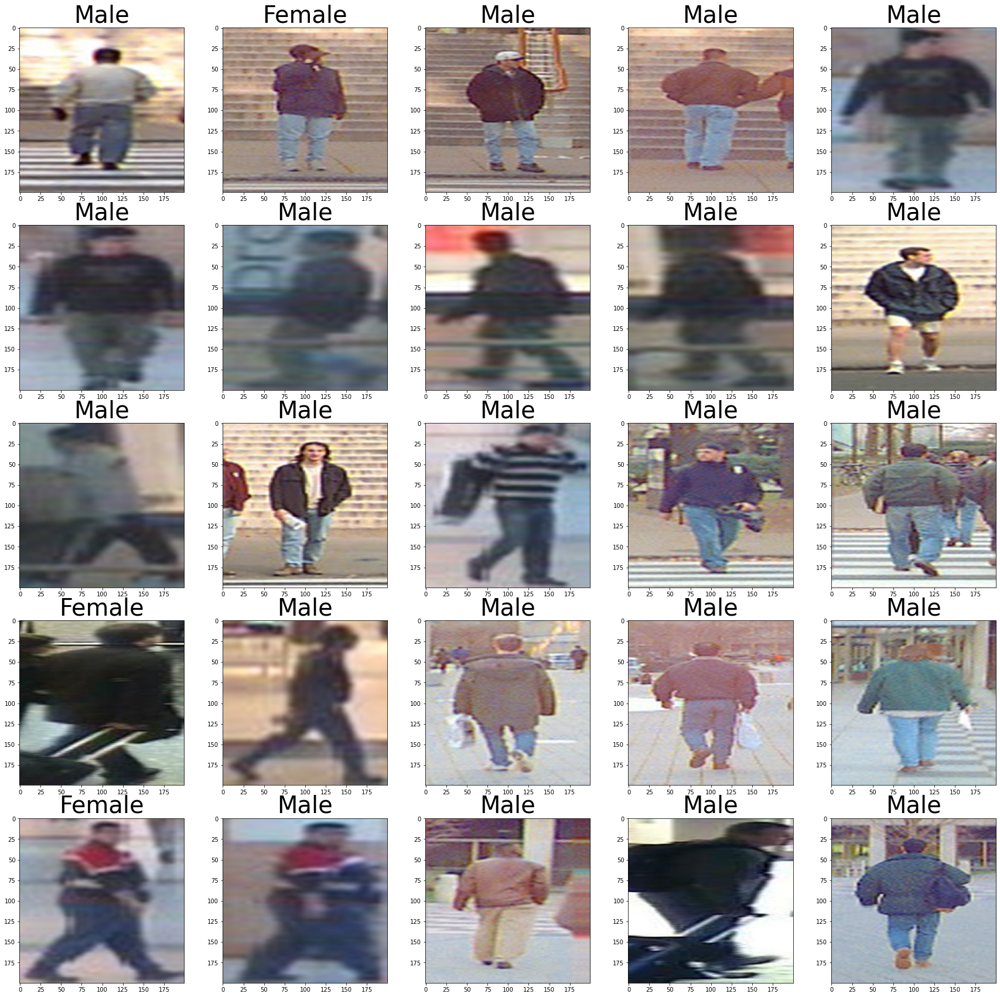

In [35]:
import matplotlib.pyplot as plt
from PIL import Image 
import os
import csv
from math import ceil

DATA_DIR = os.environ.get('LOCAL_DATA_DIR')
DATA_DOWNLOAD_DIR = os.environ.get('DATA_DOWNLOAD_DIR')
csv_path = os.path.join(DATA_DIR, 'split', 'val', 'Male', 'result.csv')
results = []
with open(csv_path) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for row in csv_reader:
        results.append((row[0], row[1]))

w,h = 200,200
fig = plt.figure(figsize=(30,30))
columns = 5
rows = 5
for i in range(1, columns*rows + 1):
    ax = fig.add_subplot(rows, columns,i)
    img = Image.open(results[i+100][0].replace(DATA_DOWNLOAD_DIR, DATA_DIR))
    img = img.resize((w,h), Image.ANTIALIAS)
    plt.imshow(img)
    ax.set_title(results[i+100][1], fontsize=40)

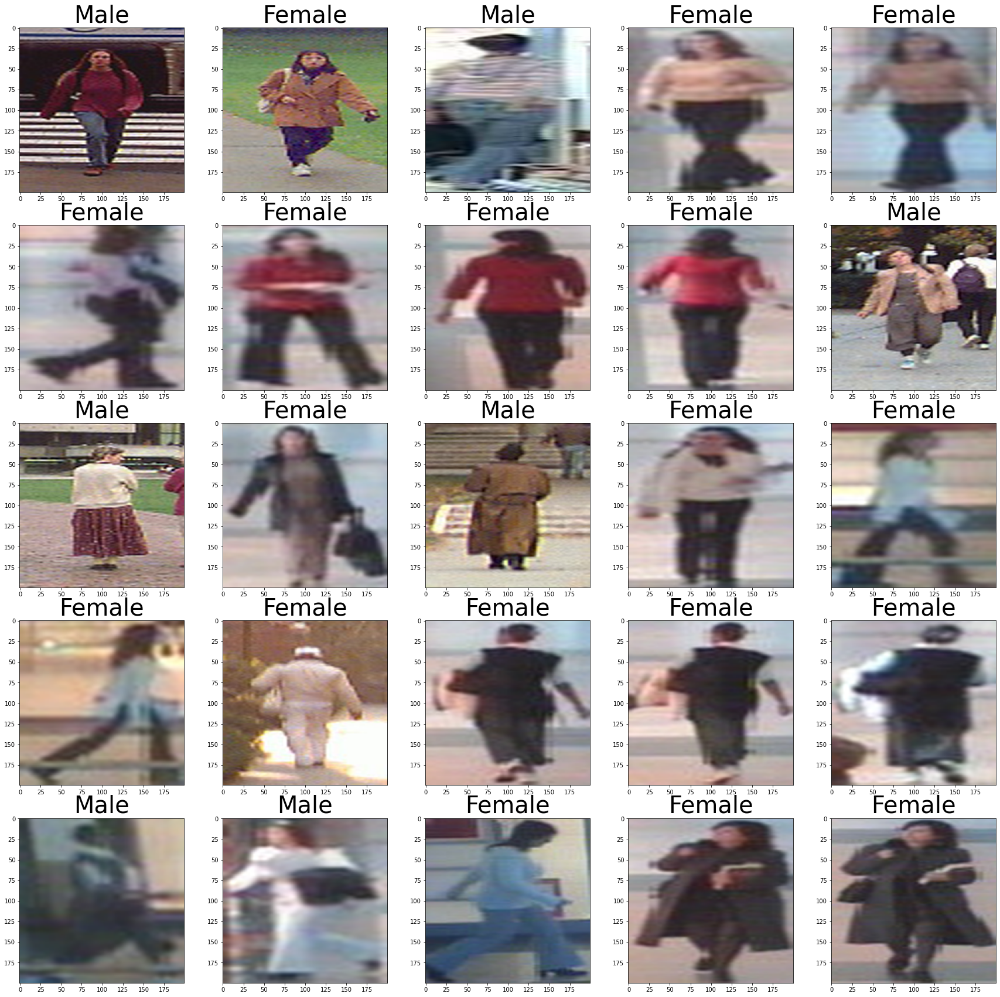

In [36]:
import matplotlib.pyplot as plt
from PIL import Image 
import os
import csv
from math import ceil

DATA_DIR = os.environ.get('LOCAL_DATA_DIR')
DATA_DOWNLOAD_DIR = os.environ.get('DATA_DOWNLOAD_DIR')
csv_path = os.path.join(DATA_DIR, 'split', 'val', 'Female', 'result.csv')
results = []
with open(csv_path) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for row in csv_reader:
        results.append((row[0], row[1]))

w,h = 200,200
fig = plt.figure(figsize=(30,30))
columns = 5
rows = 5
for i in range(1, columns*rows + 1):
    ax = fig.add_subplot(rows, columns,i)
    img = Image.open(results[i][0].replace(DATA_DOWNLOAD_DIR, DATA_DIR))
    img = img.resize((w,h), Image.ANTIALIAS)
    plt.imshow(img)
    ax.set_title(results[i][1], fontsize=40)

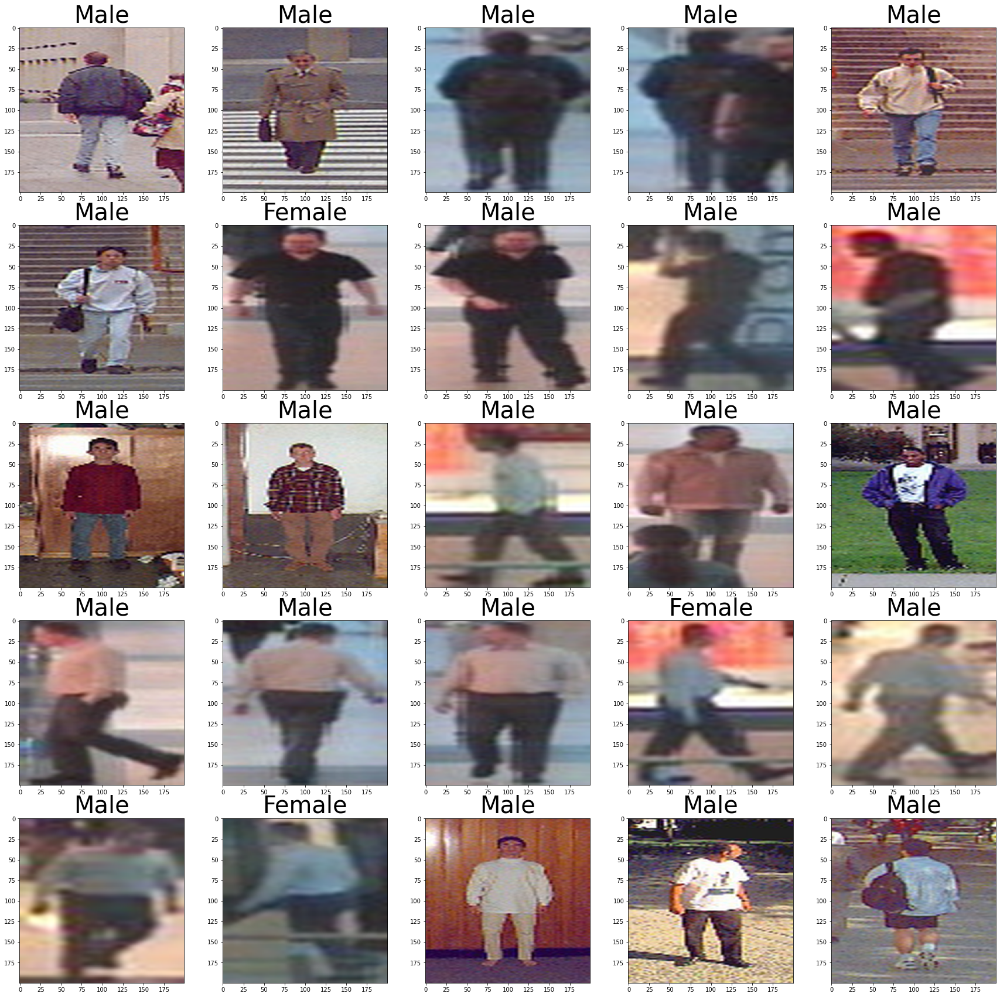

In [15]:
import matplotlib.pyplot as plt
from PIL import Image 
import os
import csv
from math import ceil

DATA_DIR = os.environ.get('LOCAL_DATA_DIR')
DATA_DOWNLOAD_DIR = os.environ.get('DATA_DOWNLOAD_DIR')
csv_path = os.path.join(DATA_DIR, 'split', 'test', 'Male', 'result.csv')
results = []
with open(csv_path) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    for row in csv_reader:
        results.append((row[0], row[1]))

w,h = 200,200
fig = plt.figure(figsize=(30,30))
columns = 5
rows = 5
for i in range(1, columns*rows + 1):
    ax = fig.add_subplot(rows, columns,i)
    img = Image.open(results[i][0].replace(DATA_DOWNLOAD_DIR, DATA_DIR))
    img = img.resize((w,h), Image.ANTIALIAS)
    plt.imshow(img)
    ax.set_title(results[i][1], fontsize=40)

## 10. Export and Deploy! <a class="anchor" id="head-10"></a>

In [37]:
!tlt classification export \
            -m $USER_EXPERIMENT_DIR/output_retrain_efficientnet/weights/efficientnet_b0_112.tlt \
            -o $USER_EXPERIMENT_DIR/export_efficientnet/final_model.etlt \
            -k $KEY

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-ma8be_3d because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.
NOTE: UFF has been tested with TensorFlow 1.14.0.
DEBUG: convert reshape to flatten node
DEBUG [/usr/local/lib/python3.6/dist-packages/uff/converters/tensorflow/converter.py:96] Marking ['predictions/Softmax'] as outputs
2021-03-15 20:23:38,708 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [13]:
print('Exported model:')
print('------------')
!ls -lh $LOCAL_EXPERIMENT_DIR/export_efficientnet/

Exported model:
------------
total 0


In [12]:
!rm $LOCAL_EXPERIMENT_DIR/export_efficientnet/*

### A. Int8 Optimization <a class="anchor" id="head-9-1"></a>
Classification model supports int8 optimization for inference in TRT. Inorder to use this, we must calibrate the model to run 8-bit inferences. This involves 2 steps

* Generate calibration tensorfile from the training data using tlt-int8-tensorfile
* Use tlt-export to generate int8 calibration table.

*Note: For this example, we generate a calibration tensorfile containing 10 batches of training data.
Ideally, it is best to use atleast 10-20% of the training data to calibrate the model.*

In [14]:
!tlt classification calibration_tensorfile -e $SPECS_DIR/efficient_retrain_spec.cfg \
                                    -m 10 \
                                    -o $USER_EXPERIMENT_DIR/export_efficientnet/calibration.tensor

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-had4hklw because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.
2021-03-23 18:03:22,485 [INFO] __main__: Loading experiment spec at /workspace/tlt-experiments/classification/specs/efficient_retrain_spec.cfg
2021-03-23 18:03:22,486 [INFO] __main__: Setting up input generator.
Found 86558 images belonging to 2 classes.
Writing calibration tensorfile: 100%|███████████| 10/10 [00:05<00:00,  1.78it/s]
2021-03-23 18:03:29,334 [INFO] __main__: Calibration tensorfile written.
2021-03-23 18:03:30,413 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.


In [15]:
# Remove the pre-existing exported .etlt file.
!rm -rf $LOCAL_EXPERIMENT_DIR/export_efficientnet/final_model.etlt
!tlt classification export \
            -m $USER_EXPERIMENT_DIR/output_retrain_efficientnet/weights/efficientnet_b0_112.tlt \
            -o $USER_EXPERIMENT_DIR/export_efficientnet/final_model.etlt \
            -k $KEY \
            --cal_data_file $USER_EXPERIMENT_DIR/export_efficientnet/calibration.tensor \
            --data_type int8 \
            --batches 10 \
            --cal_cache_file $USER_EXPERIMENT_DIR/export_efficientnet/final_model_int8_cache.bin \
            -v 

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-vzffvji7 because the default path (/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Using TensorFlow backend.
Using TensorFlow backend.
2021-03-23 18:04:19,502 [DEBUG] iva.common.export.keras_exporter: Saving etlt model file at: /workspace/tlt-experiments/classification/export_efficientnet/final_model.etlt.
2021-03-23 18:04:41,085 [DEBUG] modulus.export._uff: Patching keras BatchNormalization...
2021-03-23 18:04:41,085 [DEBUG] modulus.export._uff: Patching keras Dropout...
2021-03-23 18:04:41,085 [DEBUG] modulus.export._uff: Patching UFF TensorFlow converter apply_fused_padding...
2021-03-23 18:04:43,828 [DEBUG] modulus.export._uff: Unpatching keras BatchNormalization layer...
2021-03-23 18:04:43,828 [DEBUG] modulus.export._uff: Un

### B. Generate TensorRT engine <a class="anchor" id="head-9-2"></a>
Verify engine generation using the `tlt-converter` utility included with the docker.

The `tlt-converter` produces optimized tensorrt engines for the platform that it resides on. Therefore, to get maximum performance, please instantiate this docker and execute the `tlt-converter` command, with the exported `.etlt` file and calibration cache (for int8 mode) on your target device. The converter utility included in this docker only works for x86 devices, with discrete NVIDIA GPU's. 

For the jetson devices, please download the converter for jetson from the dev zone link [here](https://developer.nvidia.com/tlt-converter). 

If you choose to integrate your model into deepstream directly, you may do so by simply copying the exported `.etlt` file along with the calibration cache to the target device and updating the spec file that configures the `gst-nvinfer` element to point to this newly exported model. Usually this file is called `config_infer_primary.txt` for detection models and `config_infer_secondary_*.txt` for classification models.

In [16]:
!tlt tlt-converter $USER_EXPERIMENT_DIR/export_efficientnet/final_model.etlt \
               -k $KEY \
               -c $USER_EXPERIMENT_DIR/export_efficientnet/final_model_int8_cache.bin \
               -o predictions/Softmax \
               -d 3,224,224 \
               -i nchw \
               -m 64 -t int8 \
               -e $USER_EXPERIMENT_DIR/export_efficientnet/final_model.trt \
               -b 64

[INFO] Reading Calibration Cache for calibrator: EntropyCalibration2
[INFO] Generated calibration scales using calibration cache. Make sure that calibration cache has latest scales.
[INFO] To regenerate calibration cache, please delete the existing one. TensorRT will generate a new calibration cache.
[INFO] Detected 1 inputs and 1 output network tensors.
2021-03-23 18:17:42,174 [INFO] tlt.components.docker_handler.docker_handler: Stopping container.
